# Artificial Intelligence Engineer Nanodegree - Probabilistic Models
## Project: Sign Language Recognition System
- [Introduction](#intro)
- [Part 1 Feature Selection](#part1_tutorial)
    - [Tutorial](#part1_tutorial)
    - [Features Submission](#part1_submission)
    - [Features Unittest](#part1_test)
- [Part 2 Train the models](#part2_tutorial)
    - [Tutorial](#part2_tutorial)
    - [Model Selection Score Submission](#part2_submission)
    - [Model Score Unittest](#part2_test)
- [Part 3 Build a Recognizer](#part3_tutorial)
    - [Tutorial](#part3_tutorial)
    - [Recognizer Submission](#part3_submission)
    - [Recognizer Unittest](#part3_test)
- [Part 4 (OPTIONAL) Improve the WER with Language Models](#part4_info)

<a id='intro'></a>
## Introduction
The overall goal of this project is to build a word recognizer for American Sign Language video sequences, demonstrating the power of probabalistic models.  In particular, this project employs  [hidden Markov models (HMM's)](https://en.wikipedia.org/wiki/Hidden_Markov_model) to analyze a series of measurements taken from videos of American Sign Language (ASL) collected for research (see the [RWTH-BOSTON-104 Database](http://www-i6.informatik.rwth-aachen.de/~dreuw/database-rwth-boston-104.php)).  In this video, the right-hand x and y locations are plotted as the speaker signs the sentence.
[![ASLR demo](http://www-i6.informatik.rwth-aachen.de/~dreuw/images/demosample.png)](https://drive.google.com/open?id=0B_5qGuFe-wbhUXRuVnNZVnMtam8)

The raw data, train, and test sets are pre-defined.  You will derive a variety of feature sets (explored in Part 1), as well as implement three different model selection criterion to determine the optimal number of hidden states for each word model (explored in Part 2). Finally, in Part 3 you will implement the recognizer and compare the effects the different combinations of feature sets and model selection criteria.  

At the end of each Part, complete the submission cells with implementations, answer all questions, and pass the unit tests.  Then submit the completed notebook for review!

<a id='part1_tutorial'></a>
## PART 1: Data

### Features Tutorial
##### Load the initial database
A data handler designed for this database is provided in the student codebase as the `AslDb` class in the `asl_data` module.  This handler creates the initial [pandas](http://pandas.pydata.org/pandas-docs/stable/) dataframe from the corpus of data included in the `data` directory as well as dictionaries suitable for extracting data in a format friendly to the [hmmlearn](https://hmmlearn.readthedocs.io/en/latest/) library.  We'll use those to create models in Part 2.

To start, let's set up the initial database and select an example set of features for the training set.  At the end of Part 1, you will create additional feature sets for experimentation. 

In [1]:
import numpy as np
import pandas as pd
from asl_data import AslDb


asl = AslDb() # initializes the database
asl.df.head() # displays the first five rows of the asl database, indexed by video and frame

left-x  left-y  right-x  right-y  nose-x  nose-y  speaker
video frame                                                           
98    0         149     181      170      175     161      62  woman-1
      1         149     181      170      175     161      62  woman-1
      2         149     181      170      175     161      62  woman-1
      3         149     181      170      175     161      62  woman-1
      4         149     181      170      175     161      62  woman-1

In [2]:
asl.df.ix[98,1]  # look at the data available for an individual frame

left-x         149
left-y         181
right-x        170
right-y        175
nose-x         161
nose-y          62
speaker    woman-1
Name: (98, 1), dtype: object

The frame represented by video 98, frame 1 is shown here:
![Video 98](http://www-i6.informatik.rwth-aachen.de/~dreuw/database/rwth-boston-104/overview/images/orig/098-start.jpg)

##### Feature selection for training the model
The objective of feature selection when training a model is to choose the most relevant variables while keeping the model as simple as possible, thus reducing training time.  We can use the raw features already provided or derive our own and add columns to the pandas dataframe `asl.df` for selection. As an example, in the next cell a feature named `'grnd-ry'` is added. This feature is the difference between the right-hand y value and the nose y value, which serves as the "ground" right y value. 

In [3]:
asl.df['grnd-ry'] = asl.df['right-y'] - asl.df['nose-y']
asl.df.head()  # the new feature 'grnd-ry' is now in the frames dictionary

left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
98    0         149     181      170      175     161      62  woman-1   
      1         149     181      170      175     161      62  woman-1   
      2         149     181      170      175     161      62  woman-1   
      3         149     181      170      175     161      62  woman-1   
      4         149     181      170      175     161      62  woman-1   

             grnd-ry  
video frame           
98    0          113  
      1          113  
      2          113  
      3          113  
      4          113

##### Try it!

In [4]:
from asl_utils import test_features_tryit
# TODO add df columns for 'grnd-rx', 'grnd-ly', 'grnd-lx' representing differences between hand and nose locations
asl.df['grnd-rx'] = asl.df['right-x'] - asl.df['nose-x']
asl.df['grnd-ly'] = asl.df['left-y'] - asl.df['nose-y']
asl.df['grnd-lx'] = asl.df['left-x'] - asl.df['nose-x']

# test the code
test_features_tryit(asl)

asl.df sample


left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
98    0         149     181      170      175     161      62  woman-1   
      1         149     181      170      175     161      62  woman-1   
      2         149     181      170      175     161      62  woman-1   
      3         149     181      170      175     161      62  woman-1   
      4         149     181      170      175     161      62  woman-1   

             grnd-ry  grnd-rx  grnd-ly  grnd-lx  
video frame                                      
98    0          113        9      119      -12  
      1          113        9      119      -12  
      2          113        9      119      -12  
      3          113        9      119      -12  
      4          113        9      119      -12

In [5]:
# collect the features into a list
features_ground = ['grnd-rx','grnd-ry','grnd-lx','grnd-ly']
 #show a single set of features for a given (video, frame) tuple
[asl.df.ix[98,1][v] for v in features_ground]

[9, 113, -12, 119]

##### Build the training set
Now that we have a feature list defined, we can pass that list to the `build_training` method to collect the features for all the words in the training set.  Each word in the training set has multiple examples from various videos.  Below we can see the unique words that have been loaded into the training set:

In [6]:
training = asl.build_training(features_ground)
print("Training words: {}".format(training.words))

Training words: ['JOHN', 'WRITE', 'HOMEWORK', 'IX-1P', 'SEE', 'YESTERDAY', 'IX', 'LOVE', 'MARY', 'CAN', 'GO', 'GO1', 'FUTURE', 'GO2', 'PARTY', 'FUTURE1', 'HIT', 'BLAME', 'FRED', 'FISH', 'WONT', 'EAT', 'BUT', 'CHICKEN', 'VEGETABLE', 'CHINA', 'PEOPLE', 'PREFER', 'BROCCOLI', 'LIKE', 'LEAVE', 'SAY', 'BUY', 'HOUSE', 'KNOW', 'CORN', 'CORN1', 'THINK', 'NOT', 'PAST', 'LIVE', 'CHICAGO', 'CAR', 'SHOULD', 'DECIDE', 'VISIT', 'MOVIE', 'WANT', 'SELL', 'TOMORROW', 'NEXT-WEEK', 'NEW-YORK', 'LAST-WEEK', 'WILL', 'FINISH', 'ANN', 'READ', 'BOOK', 'CHOCOLATE', 'FIND', 'SOMETHING-ONE', 'POSS', 'BROTHER', 'ARRIVE', 'HERE', 'GIVE', 'MAN', 'NEW', 'COAT', 'WOMAN', 'GIVE1', 'HAVE', 'FRANK', 'BREAK-DOWN', 'SEARCH-FOR', 'WHO', 'WHAT', 'LEG', 'FRIEND', 'CANDY', 'BLUE', 'SUE', 'BUY1', 'STOLEN', 'OLD', 'STUDENT', 'VIDEOTAPE', 'BORROW', 'MOTHER', 'POTATO', 'TELL', 'BILL', 'THROW', 'APPLE', 'NAME', 'SHOOT', 'SAY-1P', 'SELF', 'GROUP', 'JANA', 'TOY1', 'MANY', 'TOY', 'ALL', 'BOY', 'TEACHER', 'GIRL', 'BOX', 'GIVE2', 'GIVE3

The training data in `training` is an object of class `WordsData` defined in the `asl_data` module.  in addition to the `words` list, data can be accessed with the `get_all_sequences`, `get_all_Xlengths`, `get_word_sequences`, and `get_word_Xlengths` methods. We need the `get_word_Xlengths` method to train multiple sequences with the `hmmlearn` library.  In the following example, notice that there are two lists; the first is a concatenation of all the sequences(the X portion) and the second is a list of the sequence lengths(the Lengths portion).

In [7]:
training.get_word_Xlengths('CHOCOLATE')

(array([[-11,  48,   7, 120],
        [-11,  48,   8, 109],
        [ -8,  49,  11,  98],
        [ -7,  50,   7,  87],
        [ -4,  54,   7,  77],
        [ -4,  54,   6,  69],
        [ -4,  54,   6,  69],
        [-13,  52,   6,  69],
        [-13,  52,   6,  69],
        [ -8,  51,   6,  69],
        [ -8,  51,   6,  69],
        [ -8,  51,   6,  69],
        [ -8,  51,   6,  69],
        [ -8,  51,   6,  69],
        [-10,  59,   7,  71],
        [-15,  64,   9,  77],
        [-17,  75,  13,  81],
        [ -4,  48,  -4, 113],
        [ -2,  53,  -4, 113],
        [ -4,  55,   2,  98],
        [ -4,  58,   2,  98],
        [ -1,  59,   2,  89],
        [ -1,  59,  -1,  84],
        [ -1,  59,  -1,  84],
        [ -7,  63,  -1,  84],
        [ -7,  63,  -1,  84],
        [ -7,  63,   3,  83],
        [ -7,  63,   3,  83],
        [ -7,  63,   3,  83],
        [ -7,  63,   3,  83],
        [ -7,  63,   3,  83],
        [ -7,  63,   3,  83],
        [ -7,  63,   3,  83],
        [ 

In [20]:
training.get_all_Xlengths()

{'ALL': (array([[-64,  36,  31, 180],
         [-64,  36,  31, 180],
         [-64,  36,  31, 180],
         [-64,  36,  31, 180],
         [-71,  39,  31, 180],
         [-71,  39,  31, 180],
         [-76,  43,  31, 180],
         [-76,  43,  31, 180],
         [-60,  39,  35, 181],
         [-60,  39,  34, 177],
         [-54,  26,  32, 177],
         [-47,  23,  27, 169],
         [-62,  35,  22, 181],
         [-81,  29,  19, 182],
         [-92,  27,  17, 181],
         [-97,  28,  17, 181],
         [-97,  28,  17, 181],
         [-86,  21,  17, 181],
         [-68,  22,  21, 184],
         [-49,  18,  24, 183],
         [-38,  15,  25, 181],
         [-31,   9,  25, 181],
         [-28,   8,  28, 180]], dtype=int64), [12, 11]),
 'ANN': (array([[ 11, 115, -10, 131],
         [ 10, 100, -10, 131],
         [  5,  87, -10, 131],
         [  2,  76, -10, 131],
         [  4,  68, -10, 131],
         [  0,  61, -10, 131],
         [ -1,  53, -10, 131],
         [ -4,  46, -10, 131],

In [22]:
training.get_word_sequences('CHOCOLATE')

[[[-11, 48, 7, 120],
  [-11, 48, 8, 109],
  [-8, 49, 11, 98],
  [-7, 50, 7, 87],
  [-4, 54, 7, 77],
  [-4, 54, 6, 69],
  [-4, 54, 6, 69],
  [-13, 52, 6, 69],
  [-13, 52, 6, 69],
  [-8, 51, 6, 69],
  [-8, 51, 6, 69],
  [-8, 51, 6, 69],
  [-8, 51, 6, 69],
  [-8, 51, 6, 69],
  [-10, 59, 7, 71],
  [-15, 64, 9, 77],
  [-17, 75, 13, 81]],
 [[-4, 48, -4, 113],
  [-2, 53, -4, 113],
  [-4, 55, 2, 98],
  [-4, 58, 2, 98],
  [-1, 59, 2, 89],
  [-1, 59, -1, 84],
  [-1, 59, -1, 84],
  [-7, 63, -1, 84],
  [-7, 63, -1, 84],
  [-7, 63, 3, 83],
  [-7, 63, 3, 83],
  [-7, 63, 3, 83],
  [-7, 63, 3, 83],
  [-7, 63, 3, 83],
  [-7, 63, 3, 83],
  [-7, 63, 3, 83],
  [-4, 70, 3, 83],
  [-4, 70, 3, 83],
  [-2, 73, 5, 90],
  [-3, 79, -4, 96]],
 [[-15, 98, 13, 135],
  [-6, 93, 12, 128],
  [-2, 89, 14, 118],
  [5, 90, 10, 108],
  [4, 86, 7, 105],
  [4, 86, 7, 105],
  [4, 86, 13, 100],
  [-3, 82, 14, 96],
  [-3, 82, 14, 96],
  [6, 89, 16, 100],
  [6, 89, 16, 100],
  [7, 85, 17, 111]]]

In [23]:
training.get_all_sequences()

{'ALL': [[[-64, 36, 31, 180],
   [-64, 36, 31, 180],
   [-64, 36, 31, 180],
   [-64, 36, 31, 180],
   [-71, 39, 31, 180],
   [-71, 39, 31, 180],
   [-76, 43, 31, 180],
   [-76, 43, 31, 180],
   [-60, 39, 35, 181],
   [-60, 39, 34, 177],
   [-54, 26, 32, 177],
   [-47, 23, 27, 169]],
  [[-62, 35, 22, 181],
   [-81, 29, 19, 182],
   [-92, 27, 17, 181],
   [-97, 28, 17, 181],
   [-97, 28, 17, 181],
   [-86, 21, 17, 181],
   [-68, 22, 21, 184],
   [-49, 18, 24, 183],
   [-38, 15, 25, 181],
   [-31, 9, 25, 181],
   [-28, 8, 28, 180]]],
 'ANN': [[[11, 115, -10, 131],
   [10, 100, -10, 131],
   [5, 87, -10, 131],
   [2, 76, -10, 131],
   [4, 68, -10, 131],
   [0, 61, -10, 131],
   [-1, 53, -10, 131],
   [-4, 46, -10, 131],
   [-5, 43, -10, 131],
   [-10, 38, -10, 131],
   [-15, 36, -10, 131],
   [-15, 36, -10, 131],
   [-15, 36, 0, 123]]],
 'APPLE': [[[-13, 15, -12, 130],
   [-15, 14, -14, 129],
   [-15, 13, -14, 128],
   [-17, 13, -16, 128],
   [-17, 14, -16, 129]],
  [[-14, 14, -11, 129],
 

###### More feature sets
So far we have a simple feature set that is enough to get started modeling.  However, we might get better results if we manipulate the raw values a bit more, so we will go ahead and set up some other options now for experimentation later.  For example, we could normalize each speaker's range of motion with grouped statistics using [Pandas stats](http://pandas.pydata.org/pandas-docs/stable/api.html#api-dataframe-stats) functions and [pandas groupby](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.groupby.html).  Below is an example for finding the means of all speaker subgroups.

In [8]:
df_means = asl.df.groupby('speaker').mean()
df_means

,left-x,left-y,right-x,right-y,nose-x,nose-y,grnd-ry,grnd-rx,grnd-ly,grnd-lx
speaker,,,,,,,,,,
man-1,206.248203,218.679449,155.464350,150.371031,175.031756,61.642600,88.728430,-19.567406,157.036848,31.216447
woman-1,164.661438,161.271242,151.017865,117.332462,162.655120,57.245098,60.087364,-11.637255,104.026144,2.006318
woman-2,183.214509,176.527232,156.866295,119.835714,170.318973,58.022098,61.813616,-13.452679,118.505134,12.895536


To select a mean that matches by speaker, use the pandas [map](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.Series.map.html) method:

In [9]:
asl.df['left-x-mean']= asl.df['speaker'].map(df_means['left-x'])
asl.df.head()

left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
98    0         149     181      170      175     161      62  woman-1   
      1         149     181      170      175     161      62  woman-1   
      2         149     181      170      175     161      62  woman-1   
      3         149     181      170      175     161      62  woman-1   
      4         149     181      170      175     161      62  woman-1   

             grnd-ry  grnd-rx  grnd-ly  grnd-lx  left-x-mean  
video frame                                                   
98    0          113        9      119      -12   164.661438  
      1          113        9      119      -12   164.661438  
      2          113        9      119      -12   164.661438  
      3          113        9      119      -12   164.661438  
      4          113        9      119      -12   164.661438

##### Try it!

In [10]:
from asl_utils import test_std_tryit
# TODO Create a dataframe named `df_std` with standard deviations grouped by speaker
df_std = asl.df.groupby('speaker').std()

# test the code
test_std_tryit(df_std)

df_std


,left-x,left-y,right-x,right-y,nose-x,nose-y,grnd-ry,grnd-rx,grnd-ly,grnd-lx,left-x-mean
speaker,,,,,,,,,,,
man-1,15.154425,36.328485,18.901917,54.902340,6.654573,5.520045,53.487999,20.269032,36.572749,15.080360,0.0
woman-1,17.573442,26.594521,16.459943,34.667787,3.549392,3.538330,33.972660,16.764706,27.117393,17.328941,0.0
woman-2,15.388711,28.825025,14.890288,39.649111,4.099760,3.416167,39.128572,16.191324,29.320655,15.050938,0.0


<a id='part1_submission'></a>
### Features Implementation Submission
Implement four feature sets and answer the question that follows.
- normalized Cartesian coordinates
    - use *mean* and *standard deviation* statistics and the [standard score](https://en.wikipedia.org/wiki/Standard_score) equation to account for speakers with different heights and arm length
    
- polar coordinates
    - calculate polar coordinates with [Cartesian to polar equations](https://en.wikipedia.org/wiki/Polar_coordinate_system#Converting_between_polar_and_Cartesian_coordinates)
    - use the [np.arctan2](https://docs.scipy.org/doc/numpy-1.10.0/reference/generated/numpy.arctan2.html) function and *swap the x and y axes* to move the $0$ to $2\pi$ discontinuity to 12 o'clock instead of 3 o'clock;  in other words, the normal break in radians value from $0$ to $2\pi$ occurs directly to the left of the speaker's nose, which may be in the signing area and interfere with results.  By swapping the x and y axes, that discontinuity move to directly above the speaker's head, an area not generally used in signing.

- delta difference
    - as described in Thad's lecture, use the difference in values between one frame and the next frames as features
    - pandas [diff method](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.diff.html) and [fillna method](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.fillna.html) will be helpful for this one

- custom features
    - These are your own design; combine techniques used above or come up with something else entirely. We look forward to seeing what you come up with! 
    Some ideas to get you started:
        - normalize using a [feature scaling equation](https://en.wikipedia.org/wiki/Feature_scaling)
        - normalize the polar coordinates
        - adding additional deltas


In [11]:
asl.df['left-x-std']= asl.df['speaker'].map(df_std['left-x'])
asl.df.head()

left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
98    0         149     181      170      175     161      62  woman-1   
      1         149     181      170      175     161      62  woman-1   
      2         149     181      170      175     161      62  woman-1   
      3         149     181      170      175     161      62  woman-1   
      4         149     181      170      175     161      62  woman-1   

             grnd-ry  grnd-rx  grnd-ly  grnd-lx  left-x-mean  left-x-std  
video frame                                                               
98    0          113        9      119      -12   164.661438   17.573442  
      1          113        9      119      -12   164.661438   17.573442  
      2          113        9      119      -12   164.661438   17.573442  
      3          113        9      119      -12   164.661438   17.573442  
      4          113        9      119      -12   164.661438   17.573442

In [12]:
asl.df['right-x-mean']= asl.df['speaker'].map(df_means['right-x'])
asl.df['right-x-std']= asl.df['speaker'].map(df_std['right-x'])
asl.df['right-y-mean']= asl.df['speaker'].map(df_means['right-y'])
asl.df['right-y-std']= asl.df['speaker'].map(df_std['right-y'])
asl.df['left-y-mean']= asl.df['speaker'].map(df_means['left-y'])
asl.df['left-y-std']= asl.df['speaker'].map(df_std['left-y'])
asl.df.head()

left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
98    0         149     181      170      175     161      62  woman-1   
      1         149     181      170      175     161      62  woman-1   
      2         149     181      170      175     161      62  woman-1   
      3         149     181      170      175     161      62  woman-1   
      4         149     181      170      175     161      62  woman-1   

             grnd-ry  grnd-rx  grnd-ly  grnd-lx  left-x-mean  left-x-std  \
video frame                                                                
98    0          113        9      119      -12   164.661438   17.573442   
      1          113        9      119      -12   164.661438   17.573442   
      2          113        9      119      -12   164.661438   17.573442   
      3          113        9      119      -12   164.661438   17.573442   
      4          113        9      119      -12   164.661438   17.573442   

             right-x-mean  right-x-std  right-y-mean  right-y-std  \
video frame                                                         
98    0        151.017865    16.459943    117.332462    34.667787   
      1        151.017865    16.459943    117.332462    34.667787   
      2        151.017865    16.459943    117.332462    34.667787   
      3        151.017865    16.459943    117.332462    34.667787   
      4        151.017865    16.459943    117.332462    34.667787   

             left-y-mean  left-y-std  
video frame                           
98    0       161.271242   26.594521  
      1       161.271242   26.594521  
      2       161.271242   26.594521  
      3       161.271242   26.594521  
      4       161.271242   26.594521

In [13]:
# TODO add features for normalized by speaker values of left, right, x, y
# Name these 'norm-rx', 'norm-ry', 'norm-lx', and 'norm-ly'
# using Z-score scaling (X-Xmean)/Xstd

features_norm = ['norm-rx', 'norm-ry', 'norm-lx','norm-ly']
asl.df['norm-rx'] = (asl.df['right-x'] - asl.df['right-x-mean'])/asl.df['right-x-std']
asl.df['norm-lx'] = (asl.df['left-x'] - asl.df['left-x-mean'])/asl.df['left-x-std']

asl.df['norm-ry'] = (asl.df['right-y'] - asl.df['right-y-mean'])/asl.df['right-y-std']
asl.df['norm-ly'] = (asl.df['left-y'] - asl.df['left-y-mean'])/asl.df['left-y-std']
asl.df.head()


left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
98    0         149     181      170      175     161      62  woman-1   
      1         149     181      170      175     161      62  woman-1   
      2         149     181      170      175     161      62  woman-1   
      3         149     181      170      175     161      62  woman-1   
      4         149     181      170      175     161      62  woman-1   

             grnd-ry  grnd-rx  grnd-ly    ...     right-x-mean  right-x-std  \
video frame                               ...                                 
98    0          113        9      119    ...       151.017865    16.459943   
      1          113        9      119    ...       151.017865    16.459943   
      2          113        9      119    ...       151.017865    16.459943   
      3          113        9      119    ...       151.017865    16.459943   
      4          113        9      119    ...       151.017865    16.459943   

             right-y-mean  right-y-std  left-y-mean  left-y-std   norm-rx  \
video frame                                                                 
98    0        117.332462    34.667787   161.271242   26.594521  1.153232   
      1        117.332462    34.667787   161.271242   26.594521  1.153232   
      2        117.332462    34.667787   161.271242   26.594521  1.153232   
      3        117.332462    34.667787   161.271242   26.594521  1.153232   
      4        117.332462    34.667787   161.271242   26.594521  1.153232   

              norm-lx   norm-ry   norm-ly  
video frame                                
98    0     -0.891199  1.663433  0.741835  
      1     -0.891199  1.663433  0.741835  
      2     -0.891199  1.663433  0.741835  
      3     -0.891199  1.663433  0.741835  
      4     -0.891199  1.663433  0.741835  

[5 rows x 23 columns]

In [14]:
# TODO add features for polar coordinate values where the nose is the origin
# Name these 'polar-rr', 'polar-rtheta', 'polar-lr', and 'polar-ltheta'
# Note that 'polar-rr' and 'polar-rtheta' refer to the radius and angle

features_polar = ['polar-rr', 'polar-rtheta', 'polar-lr', 'polar-ltheta']
asl.df['polar-rr'] = (asl.df['grnd-rx'].pow(2.) + asl.df['grnd-ry'].pow(2.)).pow(.5)
asl.df['polar-lr'] = (asl.df['grnd-lx'].pow(2.) + asl.df['grnd-ly'].pow(2.)).pow(.5)
asl.df['polar-rtheta'] = np.arctan2(asl.df['grnd-rx'], asl.df['grnd-ry'])
asl.df['polar-ltheta'] = np.arctan2(asl.df['grnd-lx'], asl.df['grnd-ly'])

asl.df.head()


left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
98    0         149     181      170      175     161      62  woman-1   
      1         149     181      170      175     161      62  woman-1   
      2         149     181      170      175     161      62  woman-1   
      3         149     181      170      175     161      62  woman-1   
      4         149     181      170      175     161      62  woman-1   

             grnd-ry  grnd-rx  grnd-ly      ...       left-y-mean  left-y-std  \
video frame                                 ...                                 
98    0          113        9      119      ...        161.271242   26.594521   
      1          113        9      119      ...        161.271242   26.594521   
      2          113        9      119      ...        161.271242   26.594521   
      3          113        9      119      ...        161.271242   26.594521   
      4          113        9      119      ...        161.271242   26.594521   

              norm-rx   norm-lx   norm-ry   norm-ly   polar-rr    polar-lr  \
video frame                                                                  
98    0      1.153232 -0.891199  1.663433  0.741835  113.35784  119.603512   
      1      1.153232 -0.891199  1.663433  0.741835  113.35784  119.603512   
      2      1.153232 -0.891199  1.663433  0.741835  113.35784  119.603512   
      3      1.153232 -0.891199  1.663433  0.741835  113.35784  119.603512   
      4      1.153232 -0.891199  1.663433  0.741835  113.35784  119.603512   

             polar-rtheta  polar-ltheta  
video frame                              
98    0          0.079478     -0.100501  
      1          0.079478     -0.100501  
      2          0.079478     -0.100501  
      3          0.079478     -0.100501  
      4          0.079478     -0.100501  

[5 rows x 27 columns]

In [15]:
# TODO add features for left, right, x, y differences by one time step, i.e. the "delta" values discussed in the lecture
# Name these 'delta-rx', 'delta-ry', 'delta-lx', and 'delta-ly'

features_delta = ['delta-rx', 'delta-ry', 'delta-lx', 'delta-ly']
asl.df['delta-rx'] = asl.df['grnd-rx'].diff(periods=1).fillna(0)
asl.df['delta-ry'] = asl.df['grnd-ry'].diff(periods=1).fillna(0)
asl.df['delta-lx'] = asl.df['grnd-lx'].diff(periods=1).fillna(0)
asl.df['delta-ly'] = asl.df['grnd-ly'].diff(periods=1).fillna(0)

asl.df.tail()

left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
125   52        148     181      171      156     162      60  woman-1   
      53        148     181      172      165     162      60  woman-1   
      54        148     181      175      173     162      60  woman-1   
      55        148     181      175      173     162      60  woman-1   
      56        148     181      175      173     162      60  woman-1   

             grnd-ry  grnd-rx  grnd-ly    ...      norm-ry   norm-ly  \
video frame                               ...                          
125   52          96        9      121    ...     1.115374  0.741835   
      53         105       10      121    ...     1.374981  0.741835   
      54         113       13      121    ...     1.605742  0.741835   
      55         113       13      121    ...     1.605742  0.741835   
      56         113       13      121    ...     1.605742  0.741835   

               polar-rr    polar-lr  polar-rtheta  polar-ltheta  delta-rx  \
video frame                                                                 
125   52      96.420952  121.807225      0.093477      -0.11519       2.0   
      53     105.475116  121.807225      0.094952      -0.11519       1.0   
      54     113.745330  121.807225      0.114541      -0.11519       3.0   
      55     113.745330  121.807225      0.114541      -0.11519       0.0   
      56     113.745330  121.807225      0.114541      -0.11519       0.0   

             delta-ry  delta-lx  delta-ly  
video frame                                
125   52          9.0       0.0       0.0  
      53          9.0       0.0       0.0  
      54          8.0       0.0       0.0  
      55          0.0       0.0       0.0  
      56          0.0       0.0       0.0  

[5 rows x 31 columns]

In [17]:
# TODO add features of your own design, which may be a combination of the above or something else
# Name these whatever you would like

# TODO define a list named 'features_custom' for building the training set
features_custom = ['custom_delta-rx', 'custom_delta-ry', 'custom_delta-lx', 'custom_delta-ly']
asl.df['custom_delta-rx'] = ( asl.df['grnd-rx']).groupby(level=0).diff(periods=1).fillna(0)  #groupby(level=0)
asl.df['custom_delta-ry'] = ( asl.df['grnd-ry']).groupby(level=0).diff(periods=1).fillna(0)  #groupby(level=0)
asl.df['custom_delta-lx'] = ( asl.df['grnd-lx']).groupby(level=0).diff(periods=1).fillna(0)  #groupby(level=0)
asl.df['custom_delta-ly'] = ( asl.df['grnd-ly']).groupby(level=0).diff(periods=1).fillna(0)  #groupby(level=0)
asl.df.tail()

left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
125   52        148     181      171      156     162      60  woman-1   
      53        148     181      172      165     162      60  woman-1   
      54        148     181      175      173     162      60  woman-1   
      55        148     181      175      173     162      60  woman-1   
      56        148     181      175      173     162      60  woman-1   

             grnd-ry  grnd-rx  grnd-ly       ...         polar-rtheta  \
video frame                                  ...                        
125   52          96        9      121       ...             0.093477   
      53         105       10      121       ...             0.094952   
      54         113       13      121       ...             0.114541   
      55         113       13      121       ...             0.114541   
      56         113       13      121       ...             0.114541   

             polar-ltheta  delta-rx  delta-ry  delta-lx  delta-ly  \
video frame                                                         
125   52         -0.11519       2.0       9.0       0.0       0.0   
      53         -0.11519       1.0       9.0       0.0       0.0   
      54         -0.11519       3.0       8.0       0.0       0.0   
      55         -0.11519       0.0       0.0       0.0       0.0   
      56         -0.11519       0.0       0.0       0.0       0.0   

             custom_delta-rx  custom_delta-ry  custom_delta-lx  \
video frame                                                      
125   52                 2.0              9.0              0.0   
      53                 1.0              9.0              0.0   
      54                 3.0              8.0              0.0   
      55                 0.0              0.0              0.0   
      56                 0.0              0.0              0.0   

             custom_delta-ly  
video frame                   
125   52                 0.0  
      53                 0.0  
      54                 0.0  
      55                 0.0  
      56                 0.0  

[5 rows x 35 columns]

**Question 1:**  What custom features did you choose for the features_custom set and why?

**Answer 1:**

<a id='part1_test'></a>
### Features Unit Testing
Run the following unit tests as a sanity check on the defined "ground", "norm", "polar", and 'delta"
feature sets.  The test simply looks for some valid values but is not exhaustive.  However, the project should not be submitted if these tests don't pass.

In [18]:
import unittest
# import numpy as np

class TestFeatures(unittest.TestCase):

    def test_features_ground(self):
        sample = (asl.df.ix[98, 1][features_ground]).tolist()
        self.assertEqual(sample, [9, 113, -12, 119])

    def test_features_norm(self):
        sample = (asl.df.ix[98, 1][features_norm]).tolist()
        np.testing.assert_almost_equal(sample, [ 1.153,  1.663, -0.891,  0.742], 3)

    def test_features_polar(self):
        sample = (asl.df.ix[98,1][features_polar]).tolist()
        np.testing.assert_almost_equal(sample, [113.3578, 0.0794, 119.603, -0.1005], 3)

    def test_features_delta(self):
        sample = (asl.df.ix[98, 0][features_delta]).tolist()
        self.assertEqual(sample, [0, 0, 0, 0])
        sample = (asl.df.ix[98, 18][features_delta]).tolist()
        self.assertTrue(sample in [[-16, -5, -2, 4], [-14, -9, 0, 0]], "Sample value found was {}".format(sample))
                         
suite = unittest.TestLoader().loadTestsFromModule(TestFeatures())
unittest.TextTestRunner().run(suite)

....
----------------------------------------------------------------------
Ran 4 tests in 0.021s

OK


<unittest.runner.TextTestResult run=4 errors=0 failures=0>

<a id='part2_tutorial'></a>
## PART 2: Model Selection
### Model Selection Tutorial
The objective of Model Selection is to tune the number of states for each word HMM prior to testing on unseen data.  In this section you will explore three methods: 
- Log likelihood using cross-validation folds (CV)
- Bayesian Information Criterion (BIC)
- Discriminative Information Criterion (DIC) 

##### Train a single word
Now that we have built a training set with sequence data, we can "train" models for each word.  As a simple starting example, we train a single word using Gaussian hidden Markov models (HMM).   By using the `fit` method during training, the [Baum-Welch Expectation-Maximization](https://en.wikipedia.org/wiki/Baum%E2%80%93Welch_algorithm) (EM) algorithm is invoked iteratively to find the best estimate for the model *for the number of hidden states specified* from a group of sample seequences. For this example, we *assume* the correct number of hidden states is 3, but that is just a guess.  How do we know what the "best" number of states for training is?  We will need to find some model selection technique to choose the best parameter.

In [24]:
import warnings
from hmmlearn.hmm import GaussianHMM

def train_a_word(word, num_hidden_states, features):
    
    warnings.filterwarnings("ignore", category=DeprecationWarning)
    training = asl.build_training(features)  
    X, lengths = training.get_word_Xlengths(word)
    model = GaussianHMM(n_components=num_hidden_states, n_iter=1000).fit(X, lengths)
    logL = model.score(X, lengths)
    return model, logL

demoword = 'BOOK'
model, logL = train_a_word(demoword, 3, features_ground)
print("Number of states trained in model for {} is {}".format(demoword, model.n_components))
print("logL = {}".format(logL))

Number of states trained in model for BOOK is 3
logL = -2331.1138127433164


In [33]:
# extra
features = features_ground
word = "BOOK"
num_hidden_states =3
warnings.filterwarnings("ignore", category=DeprecationWarning)
training = asl.build_training(features)  
X, lengths = training.get_word_Xlengths(word)
model = GaussianHMM(n_components=num_hidden_states, n_iter=1000).fit(X, lengths)
score_other = 0
for word1 in training.words:
    if word1 != word:
        X_other, length_other = training.get_word_Xlengths(word1)
        score_other = score_other + model.score(X_other, length_other)
logL = model.score(X, lengths)
print (logL)
print (score_other)

-2331.11381274
-269802.895872


In [34]:
# extra
features = features_ground
word = "BOOK"
num_hidden_states =3
warnings.filterwarnings("ignore", category=DeprecationWarning)
training = asl.build_training(features)  
X, lengths = training.get_word_Xlengths(word)
model = GaussianHMM(n_components=num_hidden_states, n_iter=1000).fit(X, lengths)
score_other = 0
for word1 in training.words:
    X_other, length_other = training.get_word_Xlengths(word1)
    score_other = score_other + model.score(X_other, length_other)
logL = model.score(X, lengths)
print (logL)
print (score_other)

-2331.11381274
-272134.009685


In [35]:
# extra

model.n_components

3

In [36]:
 # extra

model.means_

array([[ -11.45300909,   94.109178  ,   19.03512475,  102.2030162 ],
       [  -3.46504869,   50.66686933,   14.02391587,   52.04731066],
       [  -1.12415027,   69.44164191,   17.02866283,   77.7231196 ]])

In [37]:
# extra

model.covars_

array([[[  77.403668  ,    0.        ,    0.        ,    0.        ],
        [   0.        ,  203.35441965,    0.        ,    0.        ],
        [   0.        ,    0.        ,   26.68898447,    0.        ],
        [   0.        ,    0.        ,    0.        ,  156.12444034]],

       [[  49.12346305,    0.        ,    0.        ,    0.        ],
        [   0.        ,   43.04799144,    0.        ,    0.        ],
        [   0.        ,    0.        ,   39.35109609,    0.        ],
        [   0.        ,    0.        ,    0.        ,   47.24195772]],

       [[  19.70434594,    0.        ,    0.        ,    0.        ],
        [   0.        ,   16.83041492,    0.        ,    0.        ],
        [   0.        ,    0.        ,   30.51552305,    0.        ],
        [   0.        ,    0.        ,    0.        ,   11.03678246]]])

The HMM model has been trained and information can be pulled from the model, including means and variances for each feature and hidden state.  The [log likelihood](http://math.stackexchange.com/questions/892832/why-we-consider-log-likelihood-instead-of-likelihood-in-gaussian-distribution) for any individual sample or group of samples can also be calculated with the `score` method.

In [38]:
def show_model_stats(word, model):
    print("Number of states trained in model for {} is {}".format(word, model.n_components))    
    variance=np.array([np.diag(model.covars_[i]) for i in range(model.n_components)])    
    for i in range(model.n_components):  # for each hidden state
        print("hidden state #{}".format(i))
        print("mean = ", model.means_[i])
        print("variance = ", variance[i])
        print()
        
show_model_stats(demoword, model)

Number of states trained in model for BOOK is 3
hidden state #0
mean =  [ -11.45300909   94.109178     19.03512475  102.2030162 ]
variance =  [  77.403668    203.35441965   26.68898447  156.12444034]

hidden state #1
mean =  [ -3.46504869  50.66686933  14.02391587  52.04731066]
variance =  [ 49.12346305  43.04799144  39.35109609  47.24195772]

hidden state #2
mean =  [ -1.12415027  69.44164191  17.02866283  77.7231196 ]
variance =  [ 19.70434594  16.83041492  30.51552305  11.03678246]



##### Try it!
Experiment by changing the feature set, word, and/or num_hidden_states values in the next cell to see changes in values.  

In [39]:
my_testword = 'CHOCOLATE'
model, logL = train_a_word(my_testword, 3, features_ground) # Experiment here with different parameters
show_model_stats(my_testword, model)
print("logL = {}".format(logL))

Number of states trained in model for CHOCOLATE is 3
hidden state #0
mean =  [ -9.30211403  55.32333876   6.92259936  71.24057775]
variance =  [ 16.16920957  46.50917372   3.81388185  15.79446427]

hidden state #1
mean =  [   0.58333333   87.91666667   12.75        108.5       ]
variance =  [  39.41055556   18.74388889    9.855       144.4175    ]

hidden state #2
mean =  [ -5.40587658  60.1652424    2.32479599  91.3095432 ]
variance =  [   7.95073876   64.13103127   13.68077479  129.5912395 ]

logL = -601.3291470028621


##### Visualize the hidden states
We can plot the means and variances for each state and feature.  Try varying the number of states trained for the HMM model and examine the variances.  Are there some models that are "better" than others?  How can you tell?  We would like to hear what you think in the classroom online.

In [40]:
%matplotlib inline

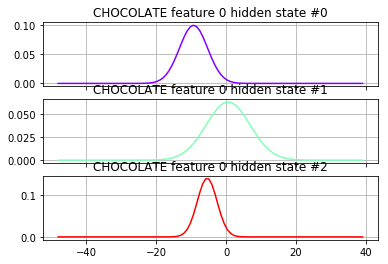

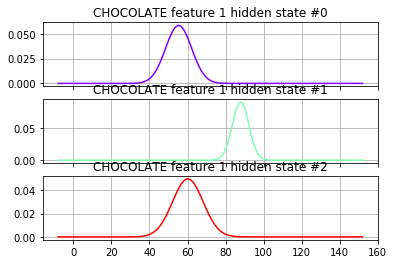

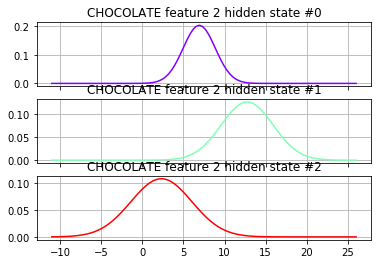

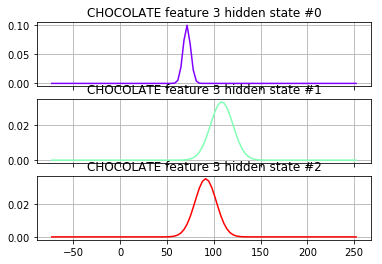

In [41]:
import math
from matplotlib import (cm, pyplot as plt, mlab)

def visualize(word, model):
    """ visualize the input model for a particular word """
    variance=np.array([np.diag(model.covars_[i]) for i in range(model.n_components)])
    figures = []
    for parm_idx in range(len(model.means_[0])):
        xmin = int(min(model.means_[:,parm_idx]) - max(variance[:,parm_idx]))
        xmax = int(max(model.means_[:,parm_idx]) + max(variance[:,parm_idx]))
        fig, axs = plt.subplots(model.n_components, sharex=True, sharey=False)
        colours = cm.rainbow(np.linspace(0, 1, model.n_components))
        for i, (ax, colour) in enumerate(zip(axs, colours)):
            x = np.linspace(xmin, xmax, 100)
            mu = model.means_[i,parm_idx]
            sigma = math.sqrt(np.diag(model.covars_[i])[parm_idx])
            ax.plot(x, mlab.normpdf(x, mu, sigma), c=colour)
            ax.set_title("{} feature {} hidden state #{}".format(word, parm_idx, i))

            ax.grid(True)
        figures.append(plt)
    for p in figures:
        p.show()
        
visualize(my_testword, model)

#####  ModelSelector class
Review the `ModelSelector` class from the codebase found in the `my_model_selectors.py` module.  It is designed to be a strategy pattern for choosing different model selectors.  For the project submission in this section, subclass `SelectorModel` to implement the following model selectors.  In other words, you will write your own classes/functions in the `my_model_selectors.py` module and run them from this notebook:

- `SelectorCV `:  Log likelihood with CV
- `SelectorBIC`: BIC 
- `SelectorDIC`: DIC

You will train each word in the training set with a range of values for the number of hidden states, and then score these alternatives with the model selector, choosing the "best" according to each strategy. The simple case of training with a constant value for `n_components` can be called using the provided `SelectorConstant` subclass as follow:

In [42]:
from my_model_selectors import SelectorConstant

training = asl.build_training(features_ground)  # Experiment here with different feature sets defined in part 1
word = 'VEGETABLE' # Experiment here with different words
model = SelectorConstant(training.get_all_sequences(), training.get_all_Xlengths(), word, n_constant=3).select()
print("Number of states trained in model for {} is {}".format(word, model.n_components))

Number of states trained in model for VEGETABLE is 3


##### Cross-validation folds
If we simply score the model with the Log Likelihood calculated from the feature sequences it has been trained on, we should expect that more complex models will have higher likelihoods. However, that doesn't tell us which would have a better likelihood score on unseen data.  The model will likely be overfit as complexity is added.  To estimate which topology model is better using only the training data, we can compare scores using cross-validation.  One technique for cross-validation is to break the training set into "folds" and rotate which fold is left out of training.  The "left out" fold scored.  This gives us a proxy method of finding the best model to use on "unseen data". In the following example, a set of word sequences is broken into three folds using the [scikit-learn Kfold](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.KFold.html) class object. When you implement `SelectorCV`, you will use this technique.

In [47]:
from sklearn.model_selection import KFold

training = asl.build_training(features_ground) # Experiment here with different feature sets
word = 'VEGETABLE' # Experiment here with different words
word_sequences = training.get_word_sequences(word)
split_method = KFold()
for cv_train_idx, cv_test_idx in split_method.split(word_sequences):
    print("Train fold indices:{} Test fold indices:{}".format(cv_train_idx, cv_test_idx))  # view indices of the folds

Train fold indices:[2 3 4 5] Test fold indices:[0 1]
Train fold indices:[0 1 4 5] Test fold indices:[2 3]
Train fold indices:[0 1 2 3] Test fold indices:[4 5]


In [56]:
split_method.get_n_splits(word_sequences)

3

In [49]:
len(word_sequences)

6

In [51]:
from asl_utils import combine_sequences

In [53]:
word_sequences

[[[-26, 52, 22, 134],
  [-26, 52, 22, 134],
  [-25, 46, 22, 134],
  [-25, 46, 22, 134],
  [-22, 42, 22, 134],
  [-24, 39, 20, 131],
  [-23, 40, 21, 132],
  [-21, 39, 21, 131],
  [-20, 38, 22, 130],
  [-21, 38, 21, 130],
  [-22, 37, 20, 129],
  [-20, 36, 22, 128],
  [-21, 37, 21, 129]],
 [[-22, 44, 26, 133],
  [-18, 40, 26, 133],
  [-21, 36, 26, 133],
  [-21, 36, 26, 133],
  [-21, 36, 26, 133],
  [-21, 36, 26, 133],
  [-21, 36, 26, 133],
  [-21, 36, 26, 133],
  [-21, 36, 26, 133]],
 [[-20, 48, 26, 183],
  [-21, 46, 26, 183],
  [-20, 43, 30, 183],
  [-20, 43, 30, 183],
  [-18, 42, 32, 182],
  [-18, 38, 32, 178],
  [-15, 35, 35, 175],
  [-16, 36, 35, 175],
  [-14, 41, 35, 175],
  [-13, 38, 36, 172],
  [-13, 41, 36, 172],
  [-11, 39, 38, 170],
  [-16, 36, 38, 170]],
 [[-20, 36, -14, 126],
  [-22, 35, -14, 126],
  [-22, 35, -14, 126],
  [-21, 31, -14, 126],
  [-18, 30, -14, 126],
  [-15, 30, -14, 126],
  [-13, 30, -14, 126],
  [-13, 30, -14, 126],
  [-16, 28, -14, 126],
  [-16, 31, -14, 126

In [54]:
 X_tests, lengths_tests = combine_sequences(cv_train_idx, word_sequences)

In [55]:
len(lengths_tests)

4

In [67]:
import math
import statistics
import warnings

import numpy as np
from hmmlearn.hmm import GaussianHMM
from sklearn.model_selection import KFold
from asl_utils import combine_sequences


class ModelSelector(object):
    '''
    base class for model selection (strategy design pattern)
    '''

    def __init__(self, all_word_sequences: dict, all_word_Xlengths: dict, this_word: str,
                 n_constant=3,
                 min_n_components=2, max_n_components=10,
                 random_state=14, verbose=False):
        self.words = all_word_sequences
        self.hwords = all_word_Xlengths
        self.sequences = all_word_sequences[this_word]
        self.X, self.lengths = all_word_Xlengths[this_word]
        self.this_word = this_word
        self.n_constant = n_constant
        self.min_n_components = min_n_components
        self.max_n_components = max_n_components
        self.random_state = random_state
        self.verbose = verbose

    def select(self):
        raise NotImplementedError

    def base_model(self, num_states):
        # with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=DeprecationWarning)
        # warnings.filterwarnings("ignore", category=RuntimeWarning)
        try:
            hmm_model = GaussianHMM(n_components=num_states, covariance_type="diag", n_iter=1000,
                                    random_state=self.random_state, verbose=False).fit(self.X, self.lengths)
            if self.verbose:
                print("model created for {} with {} states".format(self.this_word, num_states))
            return hmm_model
        except:
            if self.verbose:
                print("failure on {} with {} states".format(self.this_word, num_states))
            return None


class SelectorConstant(ModelSelector):
    """ select the model with value self.n_constant

    """

    def select(self):
        """ select based on n_constant value

        :return: GaussianHMM object
        """
        best_num_components = self.n_constant
        return self.base_model(best_num_components)


class SelectorBIC(ModelSelector):
    """ select the model with the lowest Bayesian Information Criterion(BIC) score

    http://www2.imm.dtu.dk/courses/02433/doc/ch6_slides.pdf
    Bayesian information criteria: BIC = -2 * logL + p * logN
    """

    def select(self):
        """ select the best model for self.this_word based on
        BIC score for n between self.min_n_components and self.max_n_components

        :return: GaussianHMM object
        """
        warnings.filterwarnings("ignore", category=DeprecationWarning)

        # TODO implement model selection based on BIC scores
        raise NotImplementedError


class SelectorDIC(ModelSelector):
    ''' select best model based on Discriminative Information Criterion

    Biem, Alain. "A model selection criterion for classification: Application to hmm topology optimization."
    Document Analysis and Recognition, 2003. Proceedings. Seventh International Conference on. IEEE, 2003.
    http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.58.6208&rep=rep1&type=pdf
    DIC = log(P(X(i)) - 1/(M-1)SUM(log(P(X(all but i))
    '''

    def select(self):
        warnings.filterwarnings("ignore", category=DeprecationWarning)

        # TODO implement model selection based on DIC scores
        raise NotImplementedError


class SelectorCV(ModelSelector):
    ''' select best model based on average log Likelihood of cross-validation folds

    '''

    def select(self):
        warnings.filterwarnings("ignore", category=DeprecationWarning)

        # TODO implement model selection using CV



        split_method = KFold()
        selected_model = None
        max_log_likelihood = None

        for components in range(self.min_n_components, self.max_n_components + 1):
            log_likelihood = 0
            try:
                number_splits = 0
                for cv_train_idx, cv_test_idx in split_method.split(self.sequences):
                    X_train, lengths_train = combine_sequences(cv_train_idx, self.sequences)
                    X_tests, lengths_tests = combine_sequences(cv_test_idx, self.sequences)
                    try:
                        hmm_model = GaussianHMM(n_components=components, covariance_type="diag", n_iter=1000,
                                                random_state=self.random_state, verbose=False).fit(X_train,lengths_train)
                    except:
                        best_hidden_states = self.n_constant
                        
                    number_splits+=1

                    logL = hmm_model.score(X_tests, lengths_tests)
                    log_likelihood += logL
                    
                log_likelihood = log_likelihood/number_splits
                if max_log_likelihood == None:
                    best_model = hmm_model
                    best_hidden_states = components
                    max_log_likelihood = log_likelihood
                else:
                    if (log_likelihood > max_log_likelihood):
                        best_model = hmm_model
                        best_hidden_states = components
                        max_log_likelihood = log_likelihood
            except:
                try:
                    hmm_model = GaussianHMM(n_components=components, covariance_type="diag", n_iter=1000,
                            random_state=self.random_state, verbose=False).fit(self.X,self.lengths)
                    logL = hmm_model.score(self.X, self.lengths)
                    log_likelihood += logL
                    
                    if max_log_likelihood == None:
                        best_model = hmm_model
                        best_hidden_states = components
                        max_log_likelihood = log_likelihood
                    else:
                        if (log_likelihood > max_log_likelihood):
                            best_model = hmm_model
                            best_hidden_states = components
                            max_log_likelihood = log_likelihood
                except:
                    best_hidden_states = self.n_constant
#                     print()

        return self.base_model(best_hidden_states)








**Tip:** In order to run `hmmlearn` training using the X,lengths tuples on the new folds, subsets must be combined based on the indices given for the folds.  A helper utility has been provided in the `asl_utils` module named `combine_sequences` for this purpose.

##### Scoring models with other criterion
Scoring model topologies with **BIC** balances fit and complexity within the training set for each word.  In the BIC equation, a penalty term penalizes complexity to avoid overfitting, so that it is not necessary to also use cross-validation in the selection process.  There are a number of references on the internet for this criterion.  These [slides](http://www2.imm.dtu.dk/courses/02433/doc/ch6_slides.pdf) include a formula you may find helpful for your implementation.

The advantages of scoring model topologies with **DIC** over BIC are presented by Alain Biem in this [reference](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.58.6208&rep=rep1&type=pdf) (also found [here](https://pdfs.semanticscholar.org/ed3d/7c4a5f607201f3848d4c02dd9ba17c791fc2.pdf)).  DIC scores the discriminant ability of a training set for one word against competing words.  Instead of a penalty term for complexity, it provides a penalty if model liklihoods for non-matching words are too similar to model likelihoods for the correct word in the word set.

<a id='part2_submission'></a>
### Model Selection Implementation Submission
Implement `SelectorCV`, `SelectorBIC`, and `SelectorDIC` classes in the `my_model_selectors.py` module.  Run the selectors on the following five words. Then answer the questions about your results.

**Tip:** The `hmmlearn` library may not be able to train or score all models.  Implement try/except contructs as necessary to eliminate non-viable models from consideration.

In [68]:
words_to_train = ['FISH', 'BOOK', 'VEGETABLE', 'FUTURE', 'JOHN']
import timeit

In [91]:
class SelectorCV(ModelSelector):
    ''' select best model based on average log Likelihood of cross-validation folds

    '''

    def select(self):
        warnings.filterwarnings("ignore", category=DeprecationWarning)

        # TODO implement model selection using CV
        # raise NotImplementedError
        split_method = KFold()
        max_log_likelihood = None
        for hidden_states in range(self.min_n_components, self.max_n_components + 1):
            total_log_likelihood = 0
            number_splits = 0
            try: 
                for cv_train_idx, cv_test_idx in split_method.split(self.sequences):
                    X_train, lengths_train = combine_sequences(cv_train_idx, self.sequences)
                    X_tests, lengths_tests = combine_sequences(cv_test_idx, self.sequences)

                    hmm_model = GaussianHMM(n_components=hidden_states, covariance_type="diag", n_iter=1000,
                                            random_state=self.random_state, verbose=False).fit(X_train,lengths_train)

                    number_splits+=1
                    logL = hmm_model.score(X_tests, lengths_tests)
                    total_log_likelihood += logL
                    number_splits += 1



                average_log_likelihood = total_log_likelihood/ number_splits
                if max_log_likelihood == None:
                    max_log_likelihood = average_log_likelihood
                    best_hidden_states = hidden_states
                    best_model = hmm_model
                else:
                    if (average_log_likelihood> max_log_likelihood):
                        max_log_likelihood = average_log_likelihood
                        best_hidden_states = hidden_states
                        best_model = hmm_model
            except:
                best_hidden_states = self.n_constant


        return self.base_model(best_hidden_states)


In [94]:
words_to_train = ['FISH', 'BOOK', 'VEGETABLE', 'FUTURE', 'JOHN']


In [149]:
# TODO: Implement SelectorCV in my_model_selector.py
# from my_model_selectors import SelectorCV
from importlib import reload
import my_model_selectors
reload(my_model_selectors)
from my_model_selectors import SelectorCV


training = asl.build_training(features_ground)  # Experiment here with different feature sets defined in part 1
sequences = training.get_all_sequences()
Xlengths = training.get_all_Xlengths()
for word in words_to_train:
    start = timeit.default_timer()
    model = SelectorCV(sequences, Xlengths, word, 
                    min_n_components=2, max_n_components=15, random_state = 14).select()
    end = timeit.default_timer()-start
    if model is not None:
        print("Training complete for {} with {} states with time {} seconds".format(word, model.n_components, end))
    else:
        print("Training failed for {}".format(word))

Training complete for FISH with 3 states with time 0.023481018681195565 seconds
Training complete for BOOK with 6 states with time 6.5369567935449595 seconds
Training complete for VEGETABLE with 3 states with time 2.4424794119458966 seconds
Training complete for FUTURE with 2 states with time 5.836568265751339 seconds
Training complete for JOHN with 12 states with time 52.112971640456635 seconds


In [ ]:
words_to_train = ['FISH', 'BOOK', 'VEGETABLE', 'FUTURE', 'JOHN']

In [98]:
class SelectorBIC(ModelSelector):
    """ select the model with the lowest Bayesian Information Criterion(BIC) score

    http://www2.imm.dtu.dk/courses/02433/doc/ch6_slides.pdf
    Bayesian information criteria: BIC = -2 * logL + p * logN
    """

    def select(self):
        """ select the best model for self.this_word based on
        BIC score for n between self.min_n_components and self.max_n_components

        :return: GaussianHMM object
        """
        warnings.filterwarnings("ignore", category=DeprecationWarning)

        # TODO implement model selection based on BIC scores
#         raise NotImplementedError
        selected_model = None
        min_BIC_likelihood = None

        for components in range(self.min_n_components, self.max_n_components + 1):
            log_likelihood = 0
            try:
                hmm_model = GaussianHMM(n_components=components, covariance_type="diag", n_iter=1000,
                        random_state=self.random_state, verbose=False).fit(self.X,self.lengths)
                logL = hmm_model.score(self.X, self.lengths)
#                 print(logL)
                log_likelihood += logL
                initial_state_probability = components
                variance_means = hmm_model.n_components*components*2
                transition_probabilities = components*(components-1)
                p = initial_state_probability + variance_means + transition_probabilities
                bic_score = -2*(log_likelihood) + p*np.log(len(self.lengths))

                if min_BIC_likelihood == None:
                    best_model = hmm_model
                    best_hidden_states = components
                    min_BIC_likelihood = bic_score
                else:
                    if (bic_score < min_BIC_likelihood):
                        best_model = hmm_model
                        best_hidden_states = components
                        min_BIC_likelihood = bic_score
            except:
                best_hidden_states = self.n_constant
#                     print()

        return self.base_model(best_hidden_states)

In [148]:
# TODO: Implement SelectorBIC in module my_model_selectors.py
# from my_model_selectors import SelectorBIC
from importlib import reload
import my_model_selectors
reload(my_model_selectors)
from my_model_selectors import SelectorBIC


training = asl.build_training(features_ground)  # Experiment here with different feature sets defined in part 1
sequences = training.get_all_sequences()
Xlengths = training.get_all_Xlengths()
for word in words_to_train:
    start = timeit.default_timer()
    model = SelectorBIC(sequences, Xlengths, word, 
                    min_n_components=2, max_n_components=15, random_state = 14).select()
    end = timeit.default_timer()-start
    if model is not None:
        print("Training complete for {} with {} states with time {} seconds".format(word, model.n_components, end))
    else:
        print("Training failed for {}".format(word))

Training complete for FISH with 3 states with time 0.5206720299174776 seconds
Training complete for BOOK with 8 states with time 3.1477138069194552 seconds
Training complete for VEGETABLE with 9 states with time 1.125721958165741 seconds
Training complete for FUTURE with 9 states with time 3.0331848828727743 seconds
Training complete for JOHN with 10 states with time 27.31179355402128 seconds


In [136]:
class SelectorDIC(ModelSelector):
    ''' select best model based on Discriminative Information Criterion

    Biem, Alain. "A model selection criterion for classification: Application to hmm topology optimization."
    Document Analysis and Recognition, 2003. Proceedings. Seventh International Conference on. IEEE, 2003.
    http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.58.6208&rep=rep1&type=pdf
    DIC = log(P(X(i)) - 1/(M-1)SUM(log(P(X(all but i))
    '''

    def select(self):
        warnings.filterwarnings("ignore", category=DeprecationWarning)

        # TODO implement model selection based on DIC scores
        selected_model = None
        max_DIC_score = None
        for components in range(self.min_n_components, self.max_n_components + 1):
            try:
                hmm_model = GaussianHMM(n_components=components, covariance_type="diag", n_iter=1000,
                        random_state=self.random_state, verbose=False).fit(self.X,self.lengths)
                logL_pxi = hmm_model.score(self.X, self.lengths)
                logL_all_but_pxi = 0
                other_words_total = 0
                for other_word in self.hwords:
                    if other_word != self.this_word:
                        other_x, other_lengths  = self.hwords[other_word]
                        logL_all_but_pxi = logL_all_but_pxi + hmm_model.score(other_x, other_lengths)
                        other_words_total +=1
                dic_score_component = logL_pxi + (1/other_words_total)*logL_all_but_pxi
                if (max_DIC_score == None):
                    max_DIC_score = dic_score_component
                    best_model = hmm_model
                    best_hidden_states = components
                else:
                    if (dic_score_component > max_DIC_score):
                        best_model = hmm_model
                        best_hidden_states = components
                        max_DIC_score = dic_score_component
            except:
                best_hidden_states = self.n_constant
            
                

        return self.base_model(best_hidden_states)


In [137]:
words_to_train = ['FISH', 'BOOK', 'VEGETABLE', 'FUTURE', 'JOHN']

In [141]:
# TODO: Implement SelectorDIC in module my_model_selectors.py
# from my_model_selectors import SelectorDIC
from importlib import reload
import my_model_selectors
reload(my_model_selectors)
from my_model_selectors import SelectorDIC

training = asl.build_training(features_ground)  # Experiment here with different feature sets defined in part 1
sequences = training.get_all_sequences()
Xlengths = training.get_all_Xlengths()
for word in words_to_train:
    start = timeit.default_timer()
    model = SelectorDIC(sequences, Xlengths, word, 
                    min_n_components=2, max_n_components=15, random_state = 14).select()
    end = timeit.default_timer()-start
    if model is not None:
        print("Training complete for {} with {} states with time {} seconds".format(word, model.n_components, end))
    else:
        print("Training failed for {}".format(word))

Training complete for FISH with 3 states with time 1.4122182846922442 seconds
Training complete for BOOK with 3 states with time 5.957123849299023 seconds
Training complete for VEGETABLE with 2 states with time 4.421612838212241 seconds
Training complete for FUTURE with 2 states with time 6.514472287070021 seconds
Training complete for JOHN with 14 states with time 33.79997723324141 seconds


In [142]:
from importlib import reload
import my_model_selectors
reload(my_model_selectors)
from my_model_selectors import *

**Question 2:**  Compare and contrast the possible advantages and disadvantages of the various model selectors implemented.

**Answer 2:**

<a id='part2_test'></a>
### Model Selector Unit Testing
Run the following unit tests as a sanity check on the implemented model selectors.  The test simply looks for valid interfaces  but is not exhaustive. However, the project should not be submitted if these tests don't pass.

In [147]:

from importlib import reload
import my_model_selectors
reload(my_model_selectors)

import asl_test_model_selectors
reload(asl_test_model_selectors)
# from my_model_selectors import *

from asl_test_model_selectors import TestSelectors
suite = unittest.TestLoader().loadTestsFromModule(TestSelectors())
unittest.TextTestRunner().run(suite)

....
----------------------------------------------------------------------
Ran 4 tests in 67.452s

OK


<unittest.runner.TextTestResult run=4 errors=0 failures=0>

<a id='part3_tutorial'></a>
## PART 3: Recognizer
The objective of this section is to "put it all together".  Using the four feature sets created and the three model selectors, you will experiment with the models and present your results.  Instead of training only five specific words as in the previous section, train the entire set with a feature set and model selector strategy.  
### Recognizer Tutorial
##### Train the full training set
The following example trains the entire set with the example `features_ground` and `SelectorConstant` features and model selector.  Use this pattern for you experimentation and final submission cells.



In [150]:
# autoreload for automatically reloading changes made in my_model_selectors and my_recognizer
%load_ext autoreload
%autoreload 2

from my_model_selectors import SelectorConstant

def train_all_words(features, model_selector):
    training = asl.build_training(features)  # Experiment here with different feature sets defined in part 1
    sequences = training.get_all_sequences()
    Xlengths = training.get_all_Xlengths()
    model_dict = {}
    for word in training.words:
        model = model_selector(sequences, Xlengths, word, 
                        n_constant=3).select()
        model_dict[word]=model
    return model_dict

models = train_all_words(features_ground, SelectorConstant)
print("Number of word models returned = {}".format(len(models)))

Number of word models returned = 112


In [170]:
models

{'ALL': GaussianHMM(algorithm='viterbi', covariance_type='diag', covars_prior=0.01,
       covars_weight=1, init_params='stmc', means_prior=0, means_weight=0,
       min_covar=0.001, n_components=3, n_iter=1000, params='stmc',
       random_state=14, startprob_prior=1.0, tol=0.01, transmat_prior=1.0,
       verbose=False),
 'ANN': GaussianHMM(algorithm='viterbi', covariance_type='diag', covars_prior=0.01,
       covars_weight=1, init_params='stmc', means_prior=0, means_weight=0,
       min_covar=0.001, n_components=3, n_iter=1000, params='stmc',
       random_state=14, startprob_prior=1.0, tol=0.01, transmat_prior=1.0,
       verbose=False),
 'APPLE': GaussianHMM(algorithm='viterbi', covariance_type='diag', covars_prior=0.01,
       covars_weight=1, init_params='stmc', means_prior=0, means_weight=0,
       min_covar=0.001, n_components=3, n_iter=1000, params='stmc',
       random_state=14, startprob_prior=1.0, tol=0.01, transmat_prior=1.0,
       verbose=False),
 'ARRIVE': GaussianHMM(

In [171]:
for w in models:
    print (w)

JOHN
WRITE
HOMEWORK
IX-1P
SEE
YESTERDAY
IX
LOVE
MARY
CAN
GO
GO1
FUTURE
GO2
PARTY
FUTURE1
HIT
BLAME
FRED
FISH
WONT
EAT
BUT
CHICKEN
VEGETABLE
CHINA
PEOPLE
PREFER
BROCCOLI
LIKE
LEAVE
SAY
BUY
HOUSE
KNOW
CORN
CORN1
THINK
NOT
PAST
LIVE
CHICAGO
CAR
SHOULD
DECIDE
VISIT
MOVIE
WANT
SELL
TOMORROW
NEXT-WEEK
NEW-YORK
LAST-WEEK
WILL
FINISH
ANN
READ
BOOK
CHOCOLATE
FIND
SOMETHING-ONE
POSS
BROTHER
ARRIVE
HERE
GIVE
MAN
NEW
COAT
WOMAN
GIVE1
HAVE
FRANK
BREAK-DOWN
SEARCH-FOR
WHO
WHAT
LEG
FRIEND
CANDY
BLUE
SUE
BUY1
STOLEN
OLD
STUDENT
VIDEOTAPE
BORROW
MOTHER
POTATO
TELL
BILL
THROW
APPLE
NAME
SHOOT
SAY-1P
SELF
GROUP
JANA
TOY1
MANY
TOY
ALL
BOY
TEACHER
GIRL
BOX
GIVE2
GIVE3
GET
PUTASIDE


##### Load the test set
The `build_test` method in `ASLdb` is similar to the `build_training` method already presented, but there are a few differences:
- the object is type `SinglesData` 
- the internal dictionary keys are the index of the test word rather than the word itself
- the getter methods are `get_all_sequences`, `get_all_Xlengths`, `get_item_sequences` and `get_item_Xlengths`

In [151]:
test_set = asl.build_test(features_ground)
print("Number of test set items: {}".format(test_set.num_items))
print("Number of test set sentences: {}".format(len(test_set.sentences_index)))

Number of test set items: 178
Number of test set sentences: 40


In [176]:
(test_set.get_all_Xlengths())

{0: (array([[  1,  58, -12, 122],
         [ -6,  53, -12, 122],
         [ -9,  45, -12, 122],
         [-13,  38, -12, 122],
         [-14,  34, -12, 122],
         [-13,  29, -12, 122],
         [-18,  25, -12, 122],
         [-20,  25, -12, 122],
         [-22,  22, -12, 122],
         [-18,  18, -11, 120],
         [-20,  22,  -8, 117],
         [-19,  18,  -9, 117],
         [-15,  22,  -5, 100],
         [-12,  26,   0,  93]], dtype=int64), [14]),
 1: (array([[ -5,  40,   7,  67],
         [  1,  48,  10,  57],
         [ -6,  57,   8,  52],
         [ -6,  53,   9,  52],
         [-11,  52,  12,  54],
         [-13,  47,  13,  55],
         [-16,  44,  13,  55],
         [-13,  42,  11,  59],
         [-10,  45,  11,  59],
         [ -6,  45,   7,  56],
         [ -9,  49,   7,  55],
         [ -9,  43,   7,  55],
         [ -9,  41,   7,  55],
         [ -7,  36,   7,  55]], dtype=int64), [14]),
 2: (array([[-16,  23,   9,  58],
         [-20,  17,  11,  60],
         [-23,  1

In [181]:
for _, word_x_length in test_set.get_all_Xlengths().items(): 
    print (word_x_length)

(array([[  1,  58, -12, 122],
       [ -6,  53, -12, 122],
       [ -9,  45, -12, 122],
       [-13,  38, -12, 122],
       [-14,  34, -12, 122],
       [-13,  29, -12, 122],
       [-18,  25, -12, 122],
       [-20,  25, -12, 122],
       [-22,  22, -12, 122],
       [-18,  18, -11, 120],
       [-20,  22,  -8, 117],
       [-19,  18,  -9, 117],
       [-15,  22,  -5, 100],
       [-12,  26,   0,  93]], dtype=int64), [14])
(array([[ -5,  40,   7,  67],
       [  1,  48,  10,  57],
       [ -6,  57,   8,  52],
       [ -6,  53,   9,  52],
       [-11,  52,  12,  54],
       [-13,  47,  13,  55],
       [-16,  44,  13,  55],
       [-13,  42,  11,  59],
       [-10,  45,  11,  59],
       [ -6,  45,   7,  56],
       [ -9,  49,   7,  55],
       [ -9,  43,   7,  55],
       [ -9,  41,   7,  55],
       [ -7,  36,   7,  55]], dtype=int64), [14])
(array([[-16,  23,   9,  58],
       [-20,  17,  11,  60],
       [-23,  17,  11,  66],
       [-21,  15,  13,  68],
       [-19,  14,  12,  73]

In [177]:
for word, model in models.items():
    print(word, model)

JOHN GaussianHMM(algorithm='viterbi', covariance_type='diag', covars_prior=0.01,
      covars_weight=1, init_params='stmc', means_prior=0, means_weight=0,
      min_covar=0.001, n_components=3, n_iter=1000, params='stmc',
      random_state=14, startprob_prior=1.0, tol=0.01, transmat_prior=1.0,
      verbose=False)
WRITE GaussianHMM(algorithm='viterbi', covariance_type='diag', covars_prior=0.01,
      covars_weight=1, init_params='stmc', means_prior=0, means_weight=0,
      min_covar=0.001, n_components=3, n_iter=1000, params='stmc',
      random_state=14, startprob_prior=1.0, tol=0.01, transmat_prior=1.0,
      verbose=False)
HOMEWORK GaussianHMM(algorithm='viterbi', covariance_type='diag', covars_prior=0.01,
      covars_weight=1, init_params='stmc', means_prior=0, means_weight=0,
      min_covar=0.001, n_components=3, n_iter=1000, params='stmc',
      random_state=14, startprob_prior=1.0, tol=0.01, transmat_prior=1.0,
      verbose=False)
IX-1P GaussianHMM(algorithm='viterbi', covar

In [175]:
len(test_set.wordlist)

178

In [154]:
test_set.sentences_index


{2: [0, 1, 2],
 7: [3, 4, 5, 6],
 12: [7, 8, 9, 10],
 21: [11, 12, 13, 14, 15, 16, 17, 18],
 25: [19, 20, 21, 22, 23],
 28: [24, 25, 26, 27, 28],
 30: [29, 30, 31, 32, 33],
 36: [34, 35, 36, 37, 38, 39],
 40: [40, 41, 42, 43, 44],
 43: [45, 46, 47, 48],
 50: [49, 50, 51, 52, 53],
 54: [54, 55, 56, 57, 58],
 57: [59, 60, 61, 62],
 67: [63, 64, 65, 66, 67],
 71: [68, 69, 70, 71],
 74: [72, 73, 74, 75],
 77: [76, 77, 78],
 84: [79, 80, 81, 82],
 89: [83, 84, 85, 86, 87, 88, 89],
 90: [90, 91, 92, 93, 94, 95],
 92: [96, 97, 98, 99, 100, 101],
 100: [102, 103, 104, 105],
 105: [106, 107],
 107: [108, 109, 110, 111, 112],
 108: [113, 114],
 113: [115, 116, 117, 118, 119],
 119: [120, 121, 122, 123, 124],
 122: [125, 126, 127],
 139: [128, 129, 130, 131, 132],
 142: [133, 134, 135, 136, 137],
 158: [138, 139, 140],
 167: [141, 142, 143, 144, 145],
 171: [146, 147, 148],
 174: [149, 150, 151, 152, 153],
 181: [154, 155],
 184: [156, 157, 158, 159, 160],
 189: [161, 162, 163, 164],
 193: [165, 

In [167]:
test_set.wordlist[2]
test_set.get_item_Xlengths(11)


(array([[  7,  82, -10, 126],
        [  2,  67, -10, 126],
        [-11,  61, -10, 126],
        [-11,  53, -10, 126],
        [-13,  48, -10, 126],
        [-18,  42, -10, 126],
        [-20,  40, -12, 123],
        [-20,  39, -12, 123],
        [-19,  32, -12, 121],
        [-18,  32, -12, 121],
        [-21,  34,  -8, 119],
        [-22,  36,  -8, 119],
        [-24,  37,  -8, 119],
        [-24,  37,  -9, 119],
        [-24,  37,  -9, 120],
        [-24,  37,  -8, 119],
        [-24,  37, -10, 120],
        [-24,  37, -10, 120],
        [-24,  37, -10, 120],
        [-24,  37, -10, 120],
        [-24,  37, -10, 119]], dtype=int64), [21])

In [162]:
test_set.get_all_sequences()


{0: [[[1, 58, -12, 122],
   [-6, 53, -12, 122],
   [-9, 45, -12, 122],
   [-13, 38, -12, 122],
   [-14, 34, -12, 122],
   [-13, 29, -12, 122],
   [-18, 25, -12, 122],
   [-20, 25, -12, 122],
   [-22, 22, -12, 122],
   [-18, 18, -11, 120],
   [-20, 22, -8, 117],
   [-19, 18, -9, 117],
   [-15, 22, -5, 100],
   [-12, 26, 0, 93]]],
 1: [[[-5, 40, 7, 67],
   [1, 48, 10, 57],
   [-6, 57, 8, 52],
   [-6, 53, 9, 52],
   [-11, 52, 12, 54],
   [-13, 47, 13, 55],
   [-16, 44, 13, 55],
   [-13, 42, 11, 59],
   [-10, 45, 11, 59],
   [-6, 45, 7, 56],
   [-9, 49, 7, 55],
   [-9, 43, 7, 55],
   [-9, 41, 7, 55],
   [-7, 36, 7, 55]]],
 2: [[[-16, 23, 9, 58],
   [-20, 17, 11, 60],
   [-23, 17, 11, 66],
   [-21, 15, 13, 68],
   [-19, 14, 12, 73],
   [-21, 12, 12, 75],
   [-23, 11, 7, 76],
   [-25, 14, 8, 77],
   [-21, 22, 8, 76],
   [-17, 23, 5, 72],
   [-10, 31, 3, 68],
   [-6, 39, 0, 64],
   [-4, 43, -2, 64],
   [-7, 43, -2, 67],
   [-8, 43, -2, 70],
   [-10, 42, -1, 72],
   [-10, 44, -2, 69],
   [-9, 

<a id='part3_submission'></a>
### Recognizer Implementation Submission
For the final project submission, students must implement a recognizer following guidance in the `my_recognizer.py` module.  Experiment with the four feature sets and the three model selection methods (that's 12 possible combinations). You can add and remove cells for experimentation or run the recognizers locally in some other way during your experiments, but retain the results for your discussion.  For submission, you will provide code cells of **only three** interesting combinations for your discussion (see questions below). At least one of these should produce a word error rate of less than 60%, i.e. WER < 0.60 . 

**Tip:** The hmmlearn library may not be able to train or score all models.  Implement try/except contructs as necessary to eliminate non-viable models from consideration.

In [156]:
# TODO implement the recognize method in my_recognizer
from my_recognizer import recognize
from asl_utils import show_errors

In [159]:
import warnings
from asl_data import SinglesData


def recognize(models: dict, test_set: SinglesData):
    """ Recognize test word sequences from word models set

   :param models: dict of trained models
       {'SOMEWORD': GaussianHMM model object, 'SOMEOTHERWORD': GaussianHMM model object, ...}
   :param test_set: SinglesData object
   :return: (list, list)  as probabilities, guesses
       both lists are ordered by the test set word_id
       probabilities is a list of dictionaries where each key a word and value is Log Liklihood
           [{SOMEWORD': LogLvalue, 'SOMEOTHERWORD' LogLvalue, ... },
            {SOMEWORD': LogLvalue, 'SOMEOTHERWORD' LogLvalue, ... },
            ]
       guesses is a list of the best guess words ordered by the test set word_id
           ['WORDGUESS0', 'WORDGUESS1', 'WORDGUESS2',...]
   """
    warnings.filterwarnings("ignore", category=DeprecationWarning)
    print (models)
    print("="*50)
    print (test_set.)
    print("*"*50)
    print(c+2)
    probabilities = []
    guesses = []

In [196]:
import warnings
from asl_data import SinglesData


def recognize(models: dict, test_set: SinglesData):
    """ Recognize test word sequences from word models set

   :param models: dict of trained models
       {'SOMEWORD': GaussianHMM model object, 'SOMEOTHERWORD': GaussianHMM model object, ...}
   :param test_set: SinglesData object
   :return: (list, list)  as probabilities, guesses
       both lists are ordered by the test set word_id
       probabilities is a list of dictionaries where each key a word and value is Log Liklihood
           [{SOMEWORD': LogLvalue, 'SOMEOTHERWORD' LogLvalue, ... },
            {SOMEWORD': LogLvalue, 'SOMEOTHERWORD' LogLvalue, ... },
            ]
       guesses is a list of the best guess words ordered by the test set word_id
           ['WORDGUESS0', 'WORDGUESS1', 'WORDGUESS2',...]
   """
    warnings.filterwarnings("ignore", category=DeprecationWarning)
    probabilities = []
    guesses = []
    # TODO implement the recognizer
    # return probabilities, guesses
    # raise NotImplementedError

    for _, word_x_length in test_set.get_all_Xlengths().items(): 
      X, lengths = word_x_length
      logLdictionary = {}
      best_score = None
      try:
          for word, model in models.items():
            score_this_word = model.score(X, lengths)
            logLdictionary[word] = score_this_word
            if best_score == None:
              best_score = score_this_word
              best_guess = word
            else:
              if (score_this_word > best_score):
                best_score = score_this_word
                best_guess = word

            probabilities.append(logLdictionary)
        
#             print (probabilities)
#             print (best_guess)
#             print("="*50)
      except:
          pass

      guesses.append(best_guess)
    return (probabilities,guesses )
#     print (probabilities)
#     print (guesses)
#     print("="*50)


In [200]:
import warnings
from asl_data import SinglesData


def recognize(models: dict, test_set: SinglesData):
    """ Recognize test word sequences from word models set

   :param models: dict of trained models
       {'SOMEWORD': GaussianHMM model object, 'SOMEOTHERWORD': GaussianHMM model object, ...}
   :param test_set: SinglesData object
   :return: (list, list)  as probabilities, guesses
       both lists are ordered by the test set word_id
       probabilities is a list of dictionaries where each key a word and value is Log Liklihood
           [{SOMEWORD': LogLvalue, 'SOMEOTHERWORD' LogLvalue, ... },
            {SOMEWORD': LogLvalue, 'SOMEOTHERWORD' LogLvalue, ... },
            ]
       guesses is a list of the best guess words ordered by the test set word_id
           ['WORDGUESS0', 'WORDGUESS1', 'WORDGUESS2',...]
   """
    warnings.filterwarnings("ignore", category=DeprecationWarning)
    probabilities = []
    guesses = []
    # TODO implement the recognizer
    # return probabilities, guesses
    # raise NotImplementedError

    for _, word_x_length in test_set.get_all_Xlengths().items(): 
      X, lengths = word_x_length
      logLdictionary = {}
      best_score = None

      for word, model in models.items():
        try:
            score_this_word = model.score(X, lengths)
            logLdictionary[word] = score_this_word
        except:
            logLdictionary[word] = float('-inf')

      probabilities.append(logLdictionary)
      best_guess = max(probabilities, key=probabilities.get)


      guesses.append(best_guess)
    return (probabilities,guesses )



In [199]:
stats = {'a':1000, 'b':3000, 'c': 100, 'd':3000}

max(stats, key=stats.get)

'b'

In [194]:
# TODO Choose a feature set and model selector
features = features_ground # change as needed
model_selector = SelectorConstant # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

[{'JOHN': -219.78973549669038, 'WRITE': -416.4461476455358, 'HOMEWORK': -538.37529315505572, 'IX-1P': -286.87021007622383, 'SEE': -403.61270154052909, 'YESTERDAY': -387.59560018007096, 'IX': -242.9162359713053, 'LOVE': -295.88812035138278, 'MARY': -221.79086212675494, 'CAN': -427.59826620667798, 'GO': -213.97550140589215, 'GO1': -1425.4406130038419, 'FUTURE': -237.36621034206064, 'GO2': -10948.553705302382, 'PARTY': -17660.116583467028, 'FUTURE1': -1760.1393603516078, 'HIT': -706.87826027884785, 'BLAME': -278.02015405370651, 'FRED': -2962.2737088433723, 'FISH': -1268040.3589124144, 'WONT': -890.21187531760938, 'EAT': -502.50792651907648, 'BUT': -1514.4614437919602, 'CHICKEN': -1512.3565002270052, 'VEGETABLE': -1262.1322640769561, 'CHINA': -11724.209862626967, 'PEOPLE': -1862.0266664096794, 'PREFER': -292.92322321818256, 'BROCCOLI': -1502.3477569680424, 'LIKE': -304.04024841132144, 'LEAVE': -886.53788319036335, 'SAY': -170858.05531002587, 'BUY': -372.03789917810224, 'HOUSE': -800.057683

TypeError: 'NoneType' object is not iterable

In [ ]:
# TODO Choose a feature set and model selector
# TODO Recognize the test set and display the result with the show_errors method

In [ ]:
# TODO Choose a feature set and model selector
# TODO Recognize the test set and display the result with the show_errors method

**Question 3:**  Summarize the error results from three combinations of features and model selectors.  What was the "best" combination and why?  What additional information might we use to improve our WER?  For more insight on improving WER, take a look at the introduction to Part 4.

**Answer 3:**

<a id='part3_test'></a>
### Recognizer Unit Tests
Run the following unit tests as a sanity check on the defined recognizer.  The test simply looks for some valid values but is not exhaustive. However, the project should not be submitted if these tests don't pass.

In [ ]:
from asl_test_recognizer import TestRecognize
suite = unittest.TestLoader().loadTestsFromModule(TestRecognize())
unittest.TextTestRunner().run(suite)

<a id='part4_info'></a>
## PART 4: (OPTIONAL)  Improve the WER with Language Models
We've squeezed just about as much as we can out of the model and still only get about 50% of the words right! Surely we can do better than that.  Probability to the rescue again in the form of [statistical language models (SLM)](https://en.wikipedia.org/wiki/Language_model).  The basic idea is that each word has some probability of occurrence within the set, and some probability that it is adjacent to specific other words. We can use that additional information to make better choices.

##### Additional reading and resources
- [Introduction to N-grams (Stanford Jurafsky slides)](https://web.stanford.edu/class/cs124/lec/languagemodeling.pdf)
- [Speech Recognition Techniques for a Sign Language Recognition System, Philippe Dreuw et al](https://www-i6.informatik.rwth-aachen.de/publications/download/154/Dreuw--2007.pdf) see the improved results of applying LM on *this* data!
- [SLM data for *this* ASL dataset](ftp://wasserstoff.informatik.rwth-aachen.de/pub/rwth-boston-104/lm/)

##### Optional challenge
The recognizer you implemented in Part 3 is equivalent to a "0-gram" SLM.  Improve the WER with the SLM data provided with the data set in the link above using "1-gram", "2-gram", and/or "3-gram" statistics. The `probabilities` data you've already calculated will be useful and can be turned into a pandas DataFrame if desired (see next cell).  
Good luck!  Share your results with the class!

In [ ]:
# create a DataFrame of log likelihoods for the test word items
df_probs = pd.DataFrame(data=probabilities)
df_probs.head()